# Anime Face Generation using GANs and PyTorch
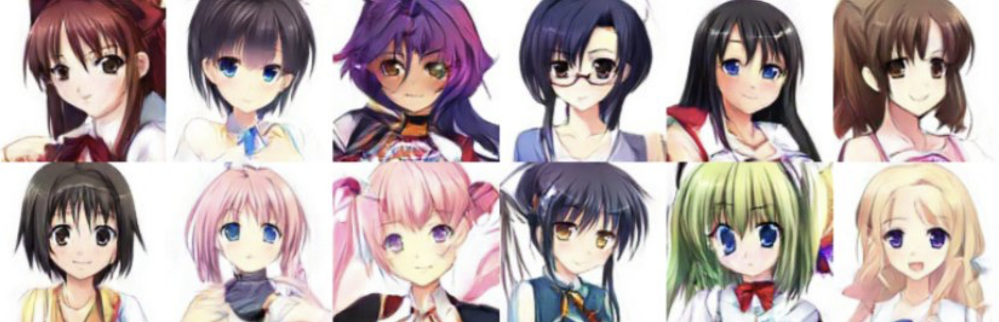

This project aims to generate new anime faces using Generative Adversarial Networks (GANs) implemented in PyTorch.

**Dataset:**
The project utilizes the Anime Face Dataset, containing a large collection of anime face images.

**Approach:**
A GAN architecture, consisting of a generator and a discriminator, is trained on the dataset.
The generator learns to create realistic anime faces, while the discriminator learns to distinguish between real and generated images.


**What is a GAN?**

A GAN, or Generative Adversarial Network, is a type of deep learning model composed of two neural networks: a **generator** and a **discriminator**. These networks are trained in an adversarial manner, meaning they compete against each other. The generator tries to create realistic data samples (like images or text), while the discriminator tries to distinguish between real data and the data generated by the generator.

**Runtime Setup**

Change your Colab runtime setup from CPU to GPU to utilize GPU acceleration. This enables faster training of the GAN model. Reason: Deep learning tasks like training GANs can be computationally expensive. GPUs provide significant speedups compared to CPUs. Change the runtime type by clicking on "Runtime" -> "Change Runtime type". Then select "GPU" from the dropdown list.


**Google Colab**

This file is intended to be run in Google Colab, a cloud-based Jupyter notebook environment. Reason: Colab provides free access to GPUs and eliminates the need to set up a local deep learning environment, making it convenient for developing and experimenting with deep learning projects.

# Setup

This section installs the necessary libraries for this project.
We will use specific versions of PyTorch and related libraries for compatibility.


In [1]:
# Install necessary PyTorch libraries with CUDA 11.8 support for GPU acceleration.
! pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118


In [2]:
# Install specific versions of PyTorch libraries and dependencies.
# ! pip install numpy matplotlib torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html

In [3]:
# Install or upgrade the opendatasets library.
! pip install opendatasets --upgrade --quiet

## Import Libraries

**PyTorch:** Provides essential tools for deep learning, including tensors and neural networks.

**torchvision:** Contains utilities for working with image data, including datasets, transformations, and model architectures.

**opendatasets:** Simplifies downloading and accessing public datasets.

**os:** Enables interaction with the operating system for tasks like file management.

**matplotlib:** Widely used for creating static, interactive, and animated visualizations in Python.

In [4]:
# PyTorch core and torchvision
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
from torchvision.utils import make_grid

# For dataset access
import opendatasets as od

# For system interactions and utilities
import os

# For visualization
import matplotlib.pyplot as plt
%matplotlib inline

## Download Dataset

**Kaggle API Setup:**

To download the dataset from Kaggle, you'll need to create an API token for your Kaggle account:

1. Go to your Kaggle account settings.
2. Under the "API" section, click "Create New API Token".
3. This will download a `kaggle.json` file containing your API credentials.
4. In Colab, upload this `kaggle.json` file to your files section (usually by clicking the folder icon on the left sidebar and then "Upload").

In [5]:
# Download the animefacedataset from Kaggle using opendatasets.
dataset_url = 'https://www.kaggle.com/splcher/animefacedataset'
od.download(dataset_url)

Skipping, found downloaded files in "./animefacedataset" (use force=True to force download)


## Data Loading and Preprocessing

This section handles loading and preprocessing the anime face dataset. It involves:

1. Defining the data directory: Specifies the location of the downloaded dataset.
2. Listing dataset contents: Verifies the dataset structure and files.
3. Setting image parameters: Defines the desired image size, batch size, and normalization statistics.
4. Creating a training dataset: Uses ImageFolder to load images from the directory and apply transformations like resizing, cropping, converting to tensors, and normalizing pixel values.
5. Creating a data loader: Uses DataLoader to efficiently load data in batches during training.

In [6]:
# Define the data directory and display its contents.
DATA_DIR = './animefacedataset'
print(os.listdir(DATA_DIR))

['images']


In [7]:
# List the first 10 image files in the 'images' subdirectory.
print(os.listdir(DATA_DIR+'/images')[:10])

['55232_2016.jpg', '37648_2012.jpg', '14953_2006.jpg', '59283_2018.jpg', '35828_2011.jpg', '14578_2006.jpg', '20171_2007.jpg', '15782_2006.jpg', '39642_2012.jpg', '38208_2012.jpg']


In [8]:
# Set image size, batch size, and normalization statistics.
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [9]:
# Create a training dataset using ImageFolder and apply transformations.
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


## Data Visualization and Denormalization

This section focuses on visualizing the dataset and denormalizing images.

**Denormalization:** Reverses the normalization applied during preprocessing to display images in their original color range.

**Visualization:** Displays batches of images and individual images using helper functions.


In [10]:
# This function reverses the normalization applied to image tensors.

def denorm(img_tensors):
    """Denormalizes image tensors."""
    return img_tensors * stats[1][0] + stats[0][0]

In [11]:
def show_images(images, nmax=64):
    """Displays a grid of images."""
    fig, ax = plt.subplots(figsize=(8, 8))  # Create figure and axes.
    ax.set_xticks([]); ax.set_yticks([])  # Hide axes ticks.
    # Denormalize, create grid, and display.
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

In [12]:
def show_batch(dl, nmax=64):
    """Displays a batch of images from a DataLoader."""
    for images, _ in dl:  # Iterate through batches in DataLoader.
        show_images(images, nmax)  # Display images from the batch.
        break  # Stop after displaying one batch.

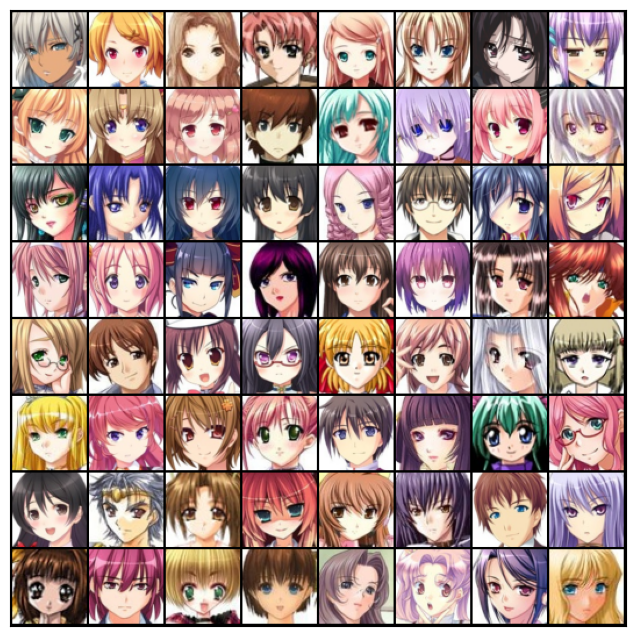

In [13]:
# Display a batch of images from the training DataLoader.
show_batch(train_dl)

## Device and Data Loading Setup

This section focuses on selecting the appropriate device (GPU or CPU) and optimizing data loading for training.

It involves:

1. Identifying the default device: Selects GPU if available, otherwise falls back to CPU.

2. Moving data to the device: Transfers data tensors to the chosen device for efficient computation.

3. Creating a DeviceDataLoader: Wraps the existing DataLoader to automatically move data to the device during training.


In [14]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

In [15]:
# Get and display the default device.
device = get_default_device()
device

device(type='cuda')

In [16]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [17]:
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [18]:
# Wrap the training DataLoader to move data to the chosen device.
train_dl = DeviceDataLoader(train_dl, device)

## Discriminator Network

This section defines and initializes the discriminator network, a crucial component of the GAN architecture. The discriminator's role is to distinguish between real and fake images.


In [20]:
import torch.nn as nn

In [21]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [22]:
# Move the discriminator to the selected device
discriminator = to_device(discriminator, device)

In [23]:
# Define the latent size for the generator
latent_size = 128

## Generator Network

This section defines and initializes the generator network, another crucial component of the GAN architecture. The generator's role is to generate fake images that are realistic enough to fool the discriminator.


In [24]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


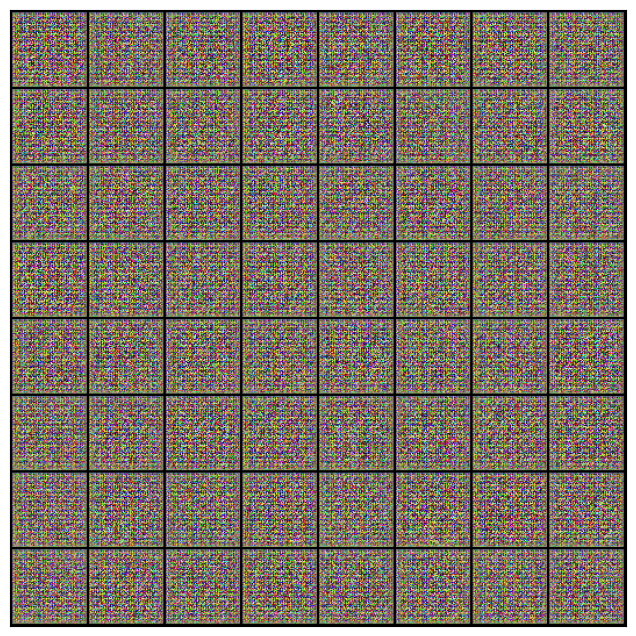

In [25]:
# Generate random latent tensors
xb = torch.randn(batch_size, latent_size, 1, 1)

# Generate fake images using the generator
fake_images = generator(xb)

print(fake_images.shape)
show_images(fake_images)

In [26]:
# Move the generator to the selected device
generator = to_device(generator, device)

## Discriminator Training

Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

In [27]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

Here are the steps involved in training the discriminator.

* We expect the discriminator to output 1 if the image was picked from the real MNIST dataset, and 0 if it was generated using the generator network.

* We first pass a batch of real images, and compute the loss, setting the target labels to 1.

* Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0.

* Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (opt_d only affects the discriminator.parameters())

## Generator Training

Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

* We generate a batch of images using the generator, pass the into the discriminator.
* We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator.
* We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

In [28]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [33]:
from torchvision.utils import save_image

In [34]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [35]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [36]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


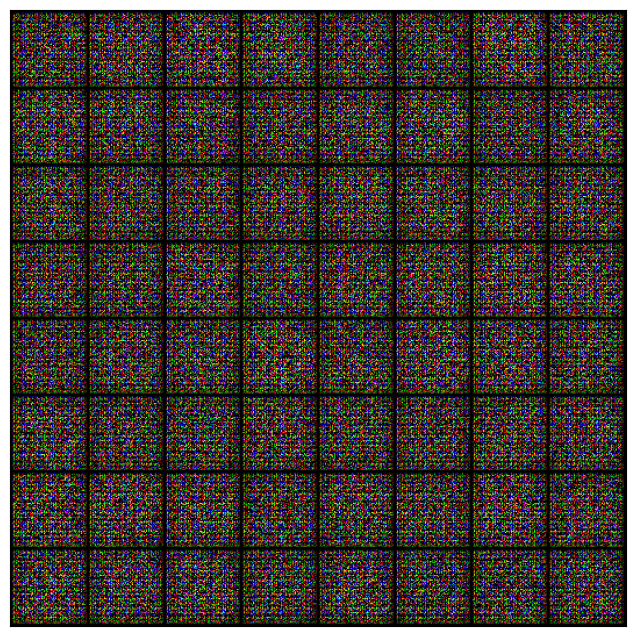

In [37]:
save_samples(0, fixed_latent)

## Full Training Loop

Let's define a fit function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

In [38]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [39]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator.

In [40]:
lr = 0.0002
epochs = 25

In [41]:
history = fit(epochs, lr)

  0%|          | 0/497 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch [1/25], loss_g: 2.6827, loss_d: 0.9335, real_score: 0.5198, fake_score: 0.0434
Saving generated-images-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 3.1391, loss_d: 0.1088, real_score: 0.9481, fake_score: 0.0492
Saving generated-images-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 4.6547, loss_d: 0.2014, real_score: 0.8980, fake_score: 0.0778
Saving generated-images-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 4.6244, loss_d: 0.1736, real_score: 0.9422, fake_score: 0.0935
Saving generated-images-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 5.1843, loss_d: 0.2942, real_score: 0.8003, fake_score: 0.0130
Saving generated-images-0005.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 12.1025, loss_d: 0.3373, real_score: 0.9812, fake_score: 0.2402
Saving generated-images-0006.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 9.6538, loss_d: 0.0947, real_score: 0.9266, fake_score: 0.0002
Saving generated-images-0007.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 4.9436, loss_d: 0.1221, real_score: 0.9440, fake_score: 0.0522
Saving generated-images-0008.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 4.6560, loss_d: 0.0636, real_score: 0.9543, fake_score: 0.0043
Saving generated-images-0009.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 8.0945, loss_d: 0.1162, real_score: 0.9743, fake_score: 0.0808
Saving generated-images-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 5.8076, loss_d: 0.0516, real_score: 0.9790, fake_score: 0.0281
Saving generated-images-0011.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 21.9317, loss_d: 1.2147, real_score: 1.0000, fake_score: 0.3882
Saving generated-images-0012.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 6.4285, loss_d: 0.0962, real_score: 0.9756, fake_score: 0.0641
Saving generated-images-0013.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 8.1369, loss_d: 0.0939, real_score: 0.9842, fake_score: 0.0699
Saving generated-images-0014.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 7.2306, loss_d: 0.1087, real_score: 0.9602, fake_score: 0.0366
Saving generated-images-0015.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 9.3100, loss_d: 0.0088, real_score: 1.0000, fake_score: 0.0086
Saving generated-images-0016.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 7.3260, loss_d: 0.0390, real_score: 0.9985, fake_score: 0.0336
Saving generated-images-0017.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 10.5117, loss_d: 0.1094, real_score: 0.9928, fake_score: 0.0929
Saving generated-images-0018.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 8.8238, loss_d: 0.0681, real_score: 0.9904, fake_score: 0.0506
Saving generated-images-0019.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 6.6140, loss_d: 0.0616, real_score: 0.9711, fake_score: 0.0278
Saving generated-images-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 6.0078, loss_d: 0.0477, real_score: 0.9667, fake_score: 0.0085
Saving generated-images-0021.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 4.8850, loss_d: 0.0562, real_score: 0.9674, fake_score: 0.0156
Saving generated-images-0022.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 5.3530, loss_d: 0.0604, real_score: 0.9711, fake_score: 0.0265
Saving generated-images-0023.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 4.7180, loss_d: 0.1821, real_score: 0.9130, fake_score: 0.0334
Saving generated-images-0024.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 25.2596, loss_d: 0.0392, real_score: 0.9663, fake_score: 0.0000
Saving generated-images-0025.png


In [42]:
losses_g, losses_d, real_scores, fake_scores = history

Now that we have trained the models, we can save checkpoints.

In [43]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

Here's how the generated images look, after the 1st, 5th, 10th, 20th and 25th epochs of training

In [45]:
from IPython.display import Image

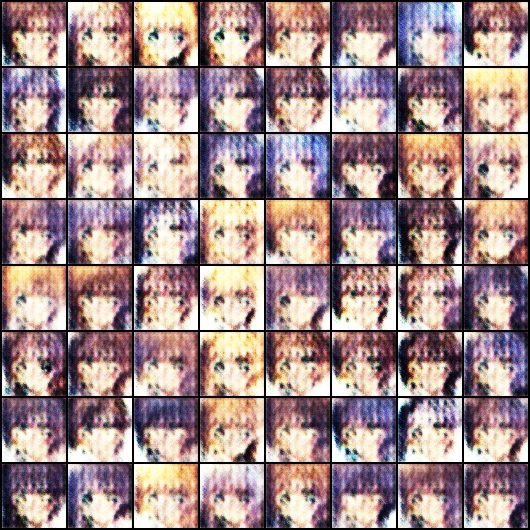

In [46]:
Image('./generated/generated-images-0001.png')

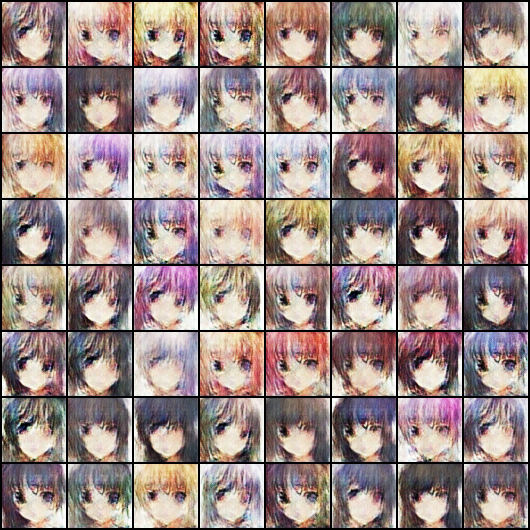

In [47]:
Image('./generated/generated-images-0005.png')

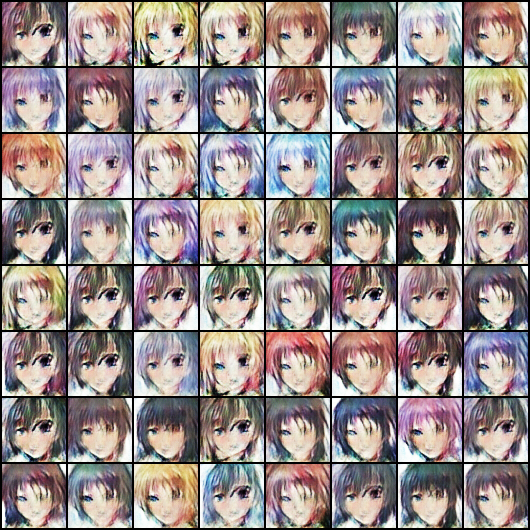

In [48]:
Image('./generated/generated-images-0010.png')

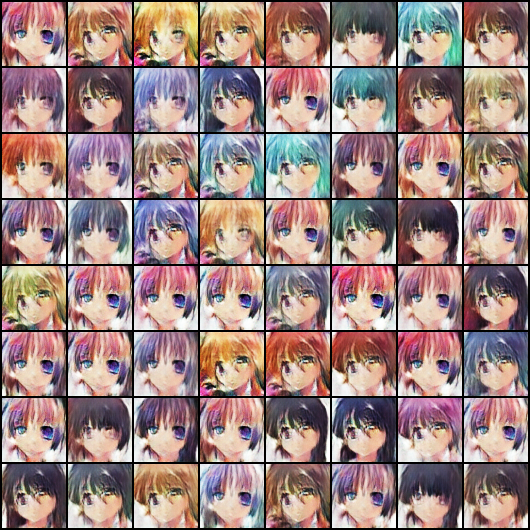

In [49]:
Image('./generated/generated-images-0020.png')

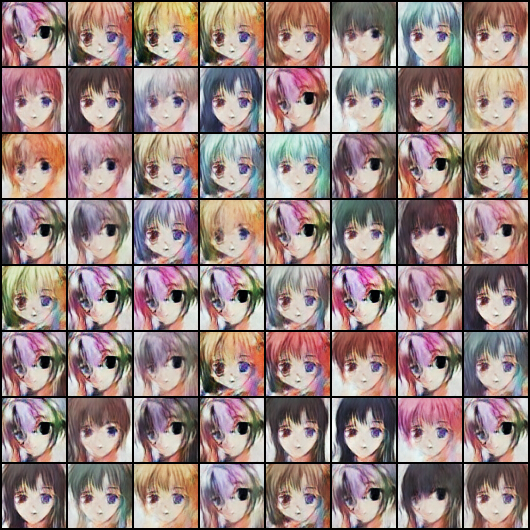

In [61]:
Image('./generated/generated-images-0022.png')

In [53]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

We can also visualize how the loss changes over time. Visualizing
losses is quite useful for debugging the training process. For GANs, we expect the generator's loss to reduce over time, without the discriminator's loss getting too high.

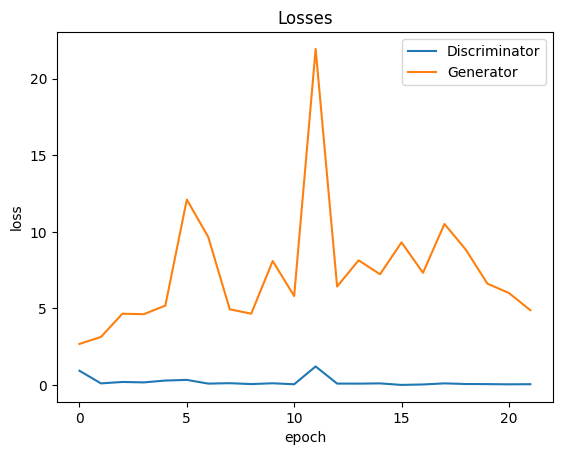

In [60]:
plt.plot(losses_d[0:22], '-')
plt.plot(losses_g[0:22], '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses')
plt.show()

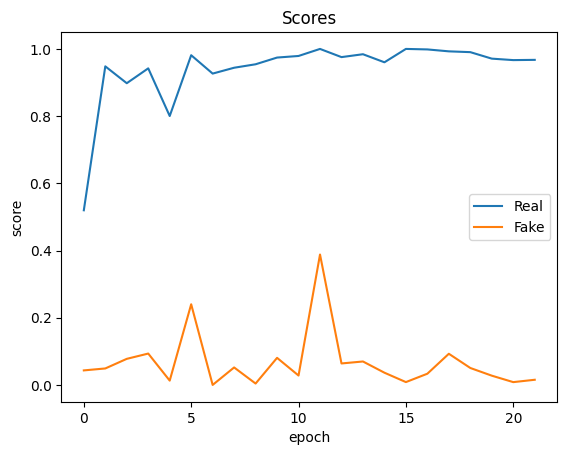

In [58]:
plt.plot(real_scores[0:22], '-')
plt.plot(fake_scores[0:22], '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores')
plt.show()